## Importing Libraries and load Data

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import os

In [2]:
# os.listdir()
data = pd.read_excel('TrainDataset2023.xls')
cols = data.columns.values

# Checking for improper column names
bad_names = [name for name in cols if re.findall(r"\W",name)]
repaired_names = [re.sub(r'\s|\(.+\)','',name) for name in cols]


# Rename columns
data.columns = repaired_names
data.columns


Index(['ID', 'pCR', 'RelapseFreeSurvival', 'Age', 'ER', 'PgR', 'HER2',
       'TrippleNegative', 'ChemoGrade', 'Proliferation',
       ...
       'original_glszm_SmallAreaHighGrayLevelEmphasis',
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_glszm_ZoneEntropy', 'original_glszm_ZonePercentage',
       'original_glszm_ZoneVariance', 'original_ngtdm_Busyness',
       'original_ngtdm_Coarseness', 'original_ngtdm_Complexity',
       'original_ngtdm_Contrast', 'original_ngtdm_Strength'],
      dtype='object', length=120)

# Data processing

In [3]:
# check duplicated rows
# No duplicates were found in data
duplicates = data.duplicated()
# duplicates[duplicates==True]
duplicates.any()

False

In [4]:
# Checking for missing values
# Missing values are coded as 999

for col in data.columns:
    data[col].replace(999,np.nan, inplace=True)

In [5]:
def check_missing(df):
    missing = df.isna().sum()
    missing = missing[missing>0]
    missing.sort_values(ascending=False,inplace=True)
    # print(missing)
    return(missing)

check_missing(data)

pCR                5
ChemoGrade         3
HistologyType      3
Proliferation      2
PgR                1
HER2               1
TrippleNegative    1
LNStatus           1
dtype: int64

In [6]:
# Since the target is outcome of treatment, imputing this variable may not be safe, therefore dropped from the dataset
# missing values in features can be imputed
data = data.loc[~data['pCR'].isna(),:]

# again check for missing values
check_missing(data)

ChemoGrade         3
HistologyType      3
Proliferation      2
PgR                1
HER2               1
TrippleNegative    1
LNStatus           1
dtype: int64

# checking unique values for each column
- This basically identifies categorical features in data, since no text labels were provided
- experiment with different thresholds to confirm

In [7]:
count_uni = dict()
for i,col in enumerate(data.columns.values):
    count_uni[col] = len(np.unique(data.loc[:,col]))

# print(count_uni)

list_cat = []
for key,val in count_uni.items():
    if count_uni[key]<10:
        list_cat.append(key)
        # print(f"{key}:{val}")

print(f"There are : {len(list_cat)} categotical fetures: {list_cat}")
    

There are : 10 categotical fetures: ['pCR', 'ER', 'PgR', 'HER2', 'TrippleNegative', 'ChemoGrade', 'Proliferation', 'HistologyType', 'LNStatus', 'TumourStage']


In [8]:
# drop ID column
data.drop('ID',axis=1,inplace=True)
data.columns

Index(['pCR', 'RelapseFreeSurvival', 'Age', 'ER', 'PgR', 'HER2',
       'TrippleNegative', 'ChemoGrade', 'Proliferation', 'HistologyType',
       ...
       'original_glszm_SmallAreaHighGrayLevelEmphasis',
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_glszm_ZoneEntropy', 'original_glszm_ZonePercentage',
       'original_glszm_ZoneVariance', 'original_ngtdm_Busyness',
       'original_ngtdm_Coarseness', 'original_ngtdm_Complexity',
       'original_ngtdm_Contrast', 'original_ngtdm_Strength'],
      dtype='object', length=119)

## Train test split
- Dataset is unbalanced, around 78 percent are negative samples for `pCR`. Therefore it is necessary that train-test split produce represenative sets 
- Train test split is done before even exploring the dataset! to ensure that the test set is unseen to avoid so called data snooping bias. Notewortthy, seeing full dataset before training may influence choice of particular algorithm, thus prone to overfitting to data. 


In [9]:
## Split the dataset into training and test sets, before pre-processing to avoid data leakage
from sklearn.model_selection import train_test_split

# X = data.loc[:,~data.columns.isin(['ID','pCR','RelapseFreeSurvival'])]
# y = data.loc[:,['pCR','RelapseFreeSurvival']]

# For classification task
# data_train, data_test = train_test_split(data,test_size=.20,shuffle=True,stratify=data['pCR'],random_state=0)

# for regression task
data_train, data_test = train_test_split(data,test_size=.20,shuffle=True,random_state=0)



print(data_train.index)
# Lets rename our training data as df to avoid any confusion in subsequent stages
# From now nowards the training set will be df, and we have reserved `data_test` for evaluation
df = data_train.copy()


Index([ 65,  56, 345, 220, 369, 371, 320, 302,  57,   8,
       ...
       212,   9, 361, 196, 252, 324, 193, 118,  48, 173],
      dtype='int64', length=316)


In [10]:
# check distribution (proportions of positive vs negative samples) of data by pCR
p_df = df['pCR'].value_counts()/sum(df['pCR'].value_counts())
p_test = data_test['pCR'].value_counts()/sum(data_test['pCR'].value_counts())

print(p_df)
print(df.shape)
print(p_test)
print(data_test.shape)

pCR
0.0    0.78481
1.0    0.21519
Name: count, dtype: float64
(316, 119)
pCR
0.0    0.797468
1.0    0.202532
Name: count, dtype: float64
(79, 119)


## Imputing missing values
- KNN imputer is preferred since it imputes values based on closely similar datapoints
- One neigbor is used for imputation, this avoids meaningless imputation for categorical features
- To avoid data leakage, a test set is reserved before any data preprocessing
- This will be used to evaluate the models after training is completed

In [11]:
# replace missing values by imputation, 
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=1)

try:
    tmp = imputer.fit_transform(df)
except KeyError:
    print('Variable not found')

imputer.feature_names_in_
imputer.n_features_in_

df_imp = pd.DataFrame(tmp,columns=imputer.get_feature_names_out())
# X_train.head()

print(df_imp.shape)
print(df.shape)

# check missing
check_missing(df_imp)

# df_imp = df.copy()

(316, 119)
(316, 119)


Series([], dtype: int64)

In [12]:

df_imp.describe()

,pCR,RelapseFreeSurvival,Age,ER,PgR,HER2,TrippleNegative,ChemoGrade,Proliferation,HistologyType,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
count,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,316.000000,...,3.160000e+02,3.160000e+02,3.160000e+02,316.000000,3.160000e+02,316.000000,316.000000,316.000000,316.000000,316.000000
mean,0.215190,56.156646,51.839012,0.544304,0.398734,0.294304,0.351266,2.386076,1.553797,1.145570,...,3.919251e-01,3.879101e-01,2.706082e+00,0.003275,2.338316e+07,196.697966,34810.163089,0.059508,0.006461,0.032696
std,0.411606,26.596502,10.877294,0.498823,0.490414,0.456452,0.478123,0.500472,0.764459,0.353234,...,1.654587e-01,1.618324e-01,7.757800e-01,0.002426,1.452636e+08,1172.520012,183589.326076,0.048897,0.008689,0.126357
min,0.000000,0.000000,23.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,7.050000e-11,7.050000e-11,-3.200000e-16,0.000008,0.000000e+00,0.000000,0.000364,0.000000,0.000000,0.000000
25%,0.000000,38.000000,44.668036,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,...,3.143849e-01,3.135620e-01,2.257874e+00,0.001246,9.978456e+05,18.551300,0.001670,0.018361,0.000301,0.001357
50%,0.000000,55.875000,51.000000,1.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,...,4.047437e-01,4.035134e-01,2.815090e+00,0.002866,3.452277e+06,70.711021,0.004186,0.049893,0.002898,0.003144
75%,0.000000,73.166667,60.000000,1.000000,1.000000,1.000000,1.000000,3.000000,2.000000,1.000000,...,4.963478e-01,4.864111e-01,3.304411e+00,0.004672,9.339816e+06,175.624909,0.014054,0.090207,0.010075,0.009558
max,1.000000,144.000000,79.603012,1.000000,1.000000,1.000000,1.000000,3.000000,3.000000,2.000000,...,8.773779e-01,8.571429e-01,4.947427e+00,0.011301,2.457482e+09,20764.693790,1000000.000000,0.285100,0.060742,1.145601


In [13]:
# Counts for targest and categorical features

#list_cat = ['pCR', 'TumourStage', 'ER']
# cols = list(df_imp.columns.values)
# list_cat =cols[cols.index('ER') :cols.index('TumourStage')+1]
# list_cat.insert(0,'pCR')

for v in list_cat:
    print(df_imp[v].value_counts())

#data['pCR'].value_counts()

pCR
0.0    248
1.0     68
Name: count, dtype: int64
ER
1.0    172
0.0    144
Name: count, dtype: int64
PgR
0.0    190
1.0    126
Name: count, dtype: int64
HER2
0.0    223
1.0     93
Name: count, dtype: int64
TrippleNegative
0.0    205
1.0    111
Name: count, dtype: int64
ChemoGrade
2.0    190
3.0    124
1.0      2
Name: count, dtype: int64
Proliferation
1.0    194
2.0     69
3.0     53
Name: count, dtype: int64
HistologyType
1.0    270
2.0     46
Name: count, dtype: int64
LNStatus
1.0    168
0.0    148
Name: count, dtype: int64
TumourStage
2.0    141
3.0     85
4.0     66
1.0     24
Name: count, dtype: int64


In [14]:
# change ER to str for hist plot
data_cat = df_imp[list_cat]
data_types =  data_cat.dtypes

for feature in list_cat:
    if data_cat[feature].dtype!=object:
        data_cat.loc[:,feature] = data_cat[feature].astype(str)
    


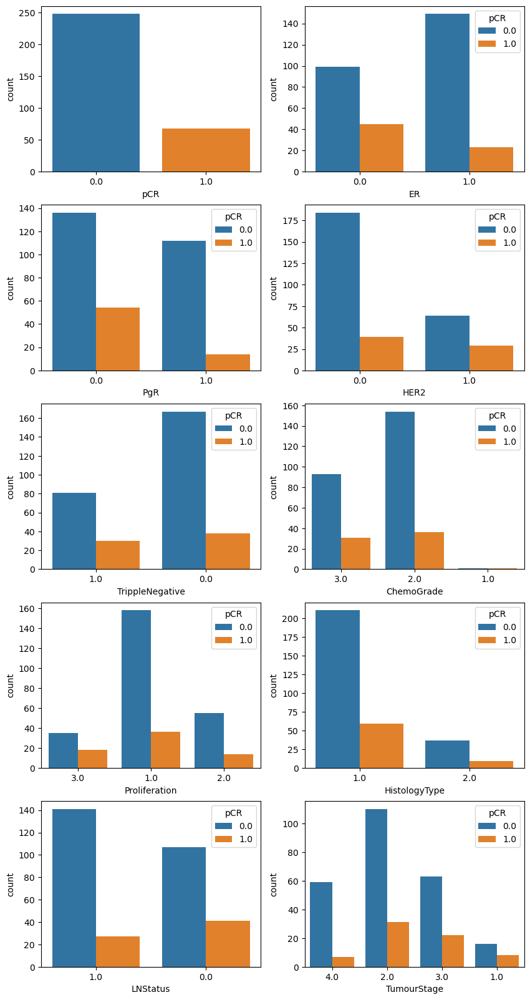

In [15]:

fig, axs = plt.subplots(5,2,figsize=(10,20))
for ax, series in zip(axs.ravel(),data_cat):
    sns.countplot(x=series,ax=ax, data=data_cat,hue='pCR')
# axs[0,0].set_title('ER')


## visualizing Continuous data
- so many features have outliers, these need be removed
- some are so huge, potentially indicating data entry errors

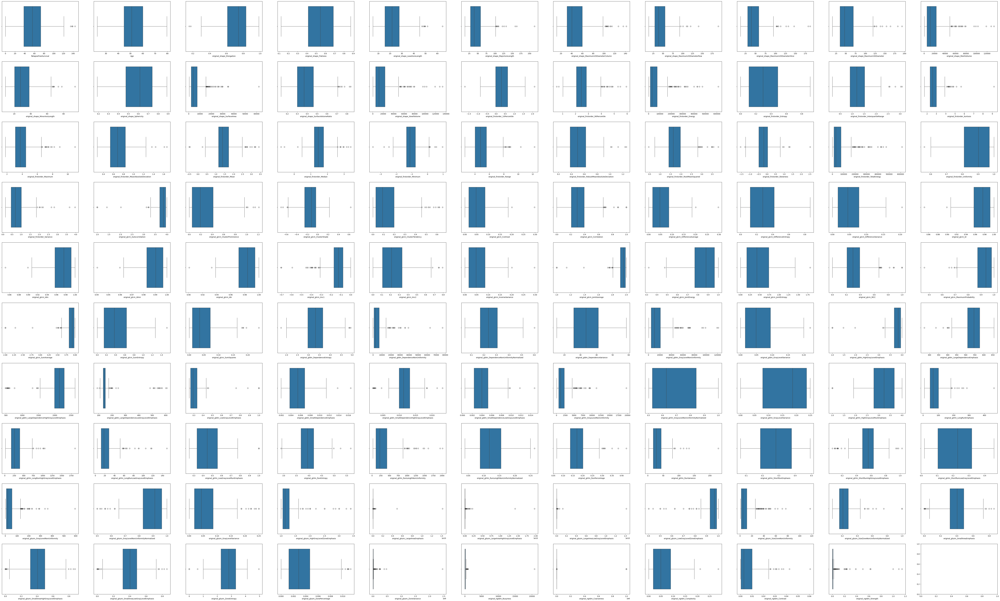

In [16]:
list_cont = [i for i in df_imp.columns.values if i not in list_cat]
data_cont = df_imp.loc[:,list_cont]


fig, axs = plt.subplots(10,11,figsize=(100,60))
for ax, series in zip(axs.ravel(),data_cont):
    sns.boxplot(x=series,ax=ax, data=data_cont)




array([[<AxesSubplot:title={'center':'RelapseFreeSurvival'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'original_shape_Elongation'}>,
        <AxesSubplot:title={'center':'original_shape_Flatness'}>,
        <AxesSubplot:title={'center':'original_shape_LeastAxisLength'}>,
        <AxesSubplot:title={'center':'original_shape_MajorAxisLength'}>,
        <AxesSubplot:title={'center':'original_shape_Maximum2DDiameterColumn'}>,
        <AxesSubplot:title={'center':'original_shape_Maximum2DDiameterRow'}>],
       [<AxesSubplot:title={'center':'original_shape_Maximum2DDiameterSlice'}>,
        <AxesSubplot:title={'center':'original_shape_Maximum3DDiameter'}>,
        <AxesSubplot:title={'center':'original_shape_MeshVolume'}>,
        <AxesSubplot:title={'center':'original_shape_MinorAxisLength'}>,
        <AxesSubplot:title={'center':'original_shape_Sphericity'}>,
        <AxesSubplot:title={'center':'original_shape_SurfaceArea'}>,
        <AxesSubplo

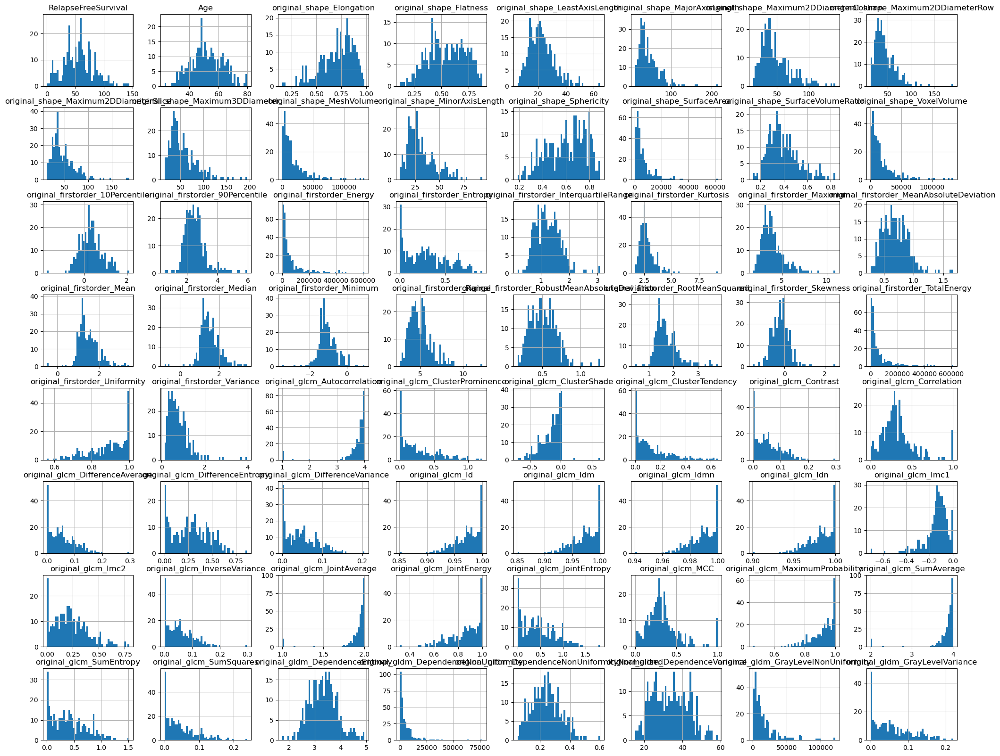

In [17]:
## Histograms for continuous data
data_cont.iloc[:,0:64].hist(bins=50,figsize=(25,20))

array([[<AxesSubplot:title={'center':'original_gldm_HighGrayLevelEmphasis'}>,
        <AxesSubplot:title={'center':'original_gldm_LargeDependenceEmphasis'}>,
        <AxesSubplot:title={'center':'original_gldm_LargeDependenceHighGrayLevelEmphasis'}>,
        <AxesSubplot:title={'center':'original_gldm_LargeDependenceLowGrayLevelEmphasis'}>,
        <AxesSubplot:title={'center':'original_gldm_LowGrayLevelEmphasis'}>,
        <AxesSubplot:title={'center':'original_gldm_SmallDependenceEmphasis'}>,
        <AxesSubplot:title={'center':'original_gldm_SmallDependenceHighGrayLevelEmphasis'}>],
       [<AxesSubplot:title={'center':'original_gldm_SmallDependenceLowGrayLevelEmphasis'}>,
        <AxesSubplot:title={'center':'original_glrlm_GrayLevelNonUniformity'}>,
        <AxesSubplot:title={'center':'original_glrlm_GrayLevelNonUniformityNormalized'}>,
        <AxesSubplot:title={'center':'original_glrlm_GrayLevelVariance'}>,
        <AxesSubplot:title={'center':'original_glrlm_HighGrayLevelRun

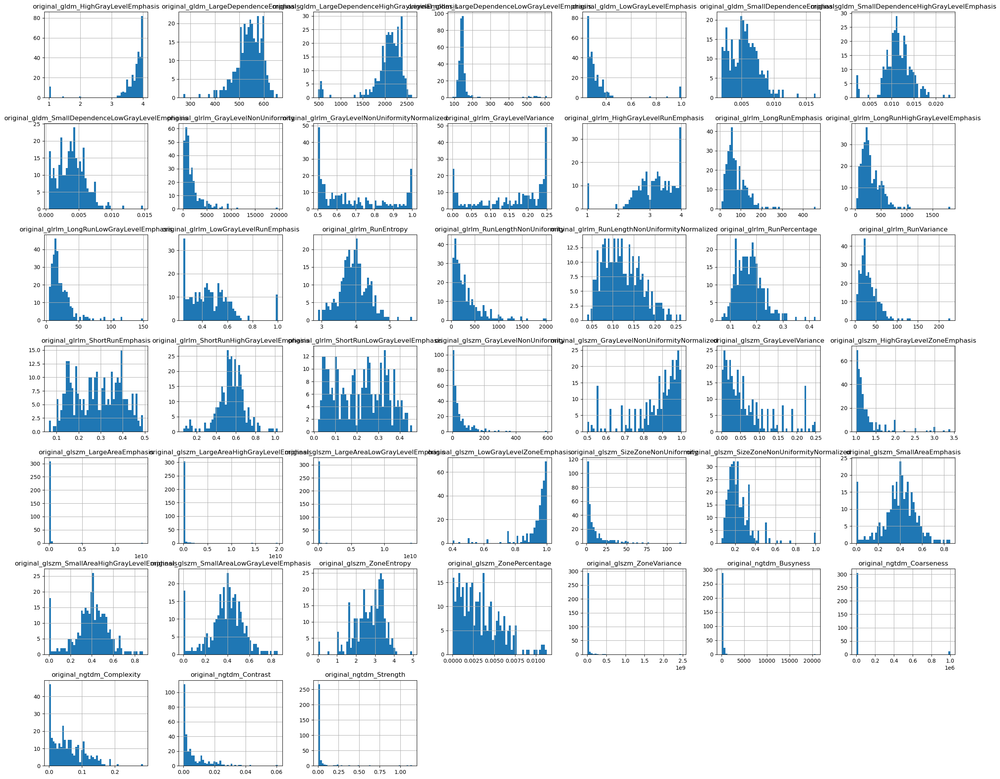

In [18]:
data_cont.iloc[:,64:data_cont.shape[1]].hist(bins=50,figsize=(30,25))

## Pairs plots
- A quick glance show weak correlarion of features with target, however strongly correlated to each other, epecially image data

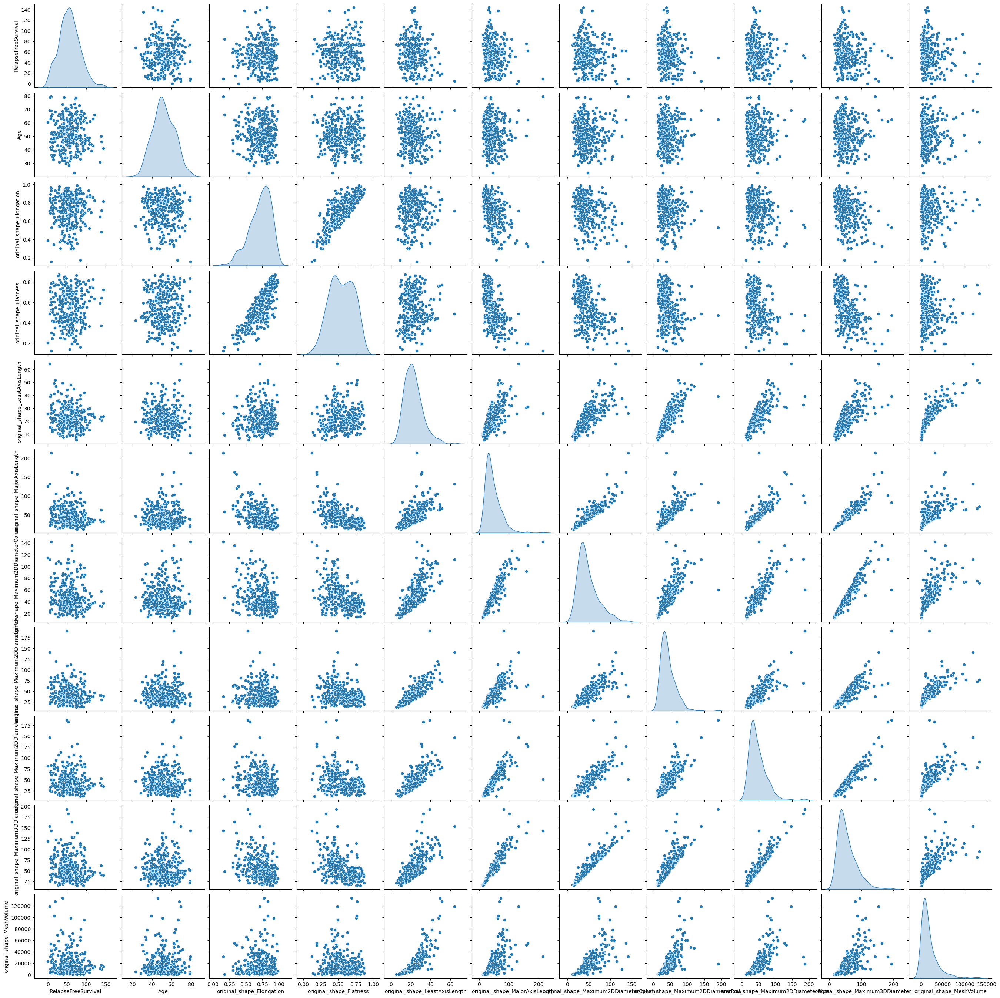

In [19]:
# Pairs plots
# add pcr to color pairs plots to check more clearly
list_cont_pcr = list_cont[:]
list_cont_pcr.insert(0,'pCR')
df.loc[:,list_cont_pcr]
# fig, axs = plt.subplots(8,6, figsize=(30,25))
# # for ax, series in zip(axs.ravel(),data_cont):
sns.pairplot(data=df.loc[:,list_cont[0:11]],diag_kind='kde')
# type(list_cont_pcr)

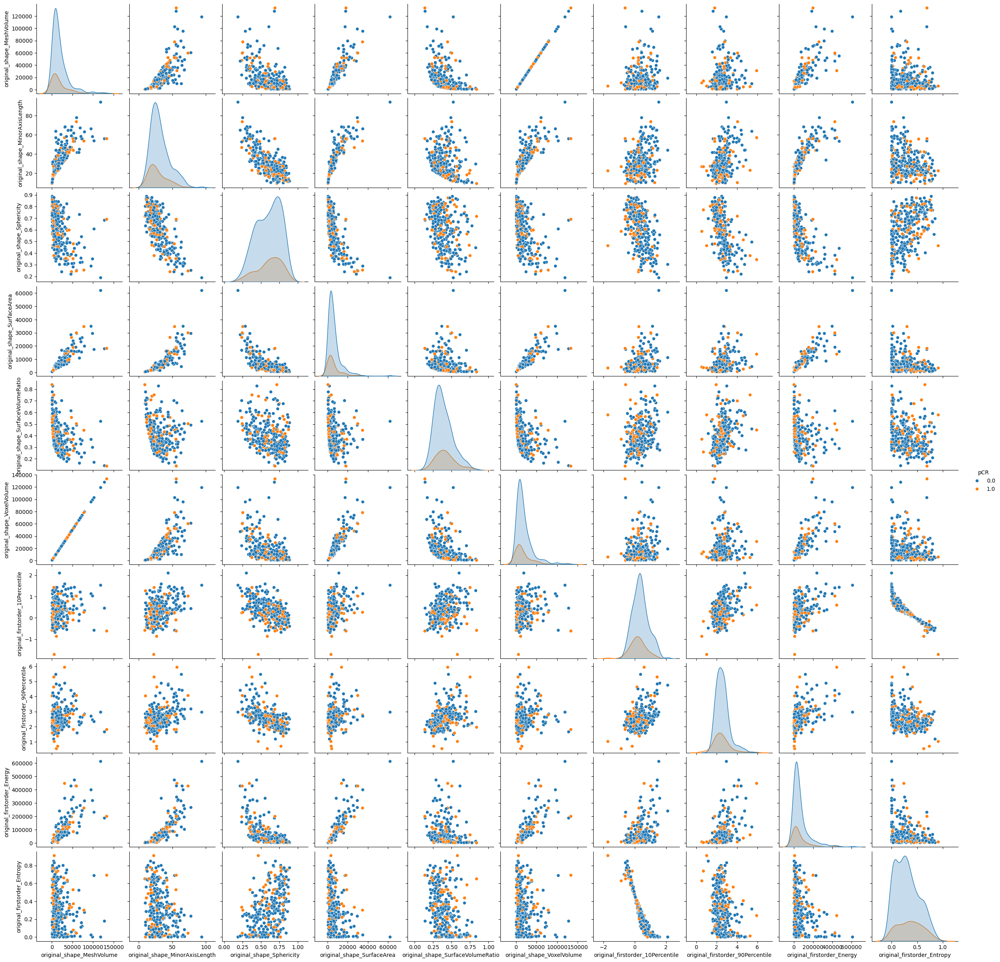

In [20]:
l2 = list_cont_pcr[11:21]
l2.insert(0,'pCR')
sns.pairplot(data=df.loc[:,l2],hue='pCR')

## comparing fearure ranges
 - Huge difference between feature ranges, normalization necessary

<AxesSubplot:>

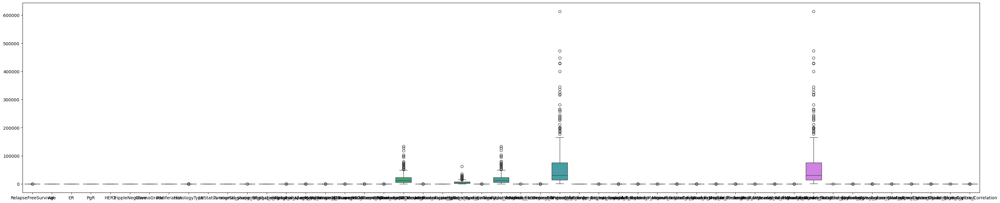

In [21]:

fig,ax=plt.subplots(1,figsize=(40,8))
sns.boxplot(data=df.iloc[:,1:50],ax=ax)

## Lets deal with outliers!!
- Identify them by using factor 1.5*IQR, 
Ref: Brownlee, J., 2020. Data preparation for machine learning: data cleaning, feature selection, and data transforms in Python. Machine Learning Mastery.
- lets replace them with median values!

In [22]:
class OutlierRemover:
    """
    Takes `dataframe` as an input and list of continuous features in data frame 'cont_features_list'
    to get a list of features with outliers pass `.features_with_outliers` attribute to OutlierRemover object instance
    """
    def __init__(self,dataframe,cont_features_list):
        self.dataframe = dataframe
        self.cont_features_list = cont_features_list


    def transform(self,factor=3):
        """
        Factor is a multiplying factor to the interquartile range (IQR), cutoff = factor*IQR. Default is 3 for extreme outliers, 1.5 can be used.
        An outlier is identified as feature value that is larger than 3rd quatile + cutoff or less 1st quartile - cutoff value.
        """
        data_cont = self.dataframe.loc[:,self.dataframe.columns.isin(self.cont_features_list)]
        p25, p50, p75 = np.nanquantile(data_cont,.25,axis=0),np.nanquantile(data_cont,.5,axis=0),np.nanquantile(data_cont,.75,axis=0)

        cutoff = factor*(p75-p25) 
        lower, upper = p25 - cutoff, p75 + cutoff

        dict_upper = dict()
        dict_lower = dict()
        dict_med = dict()
        for low, up, med,col in zip(lower,upper,p50,data_cont.columns.values):
            dict_lower[col] = low
            dict_upper[col] = up
            dict_med[col] = med


        self.features_with_outliers = []
        for col in data_cont.columns.values:
            if any(data_cont[col]<dict_lower[col]) or any(data_cont[col]>dict_upper[col]):
                self.features_with_outliers.append(col)

        # for col in data_cont.columns.values:
        for col in self.features_with_outliers:
            data_cont.loc[data_cont[col]>dict_upper[col],col] = dict_med[col]
            data_cont.loc[data_cont[col]<dict_lower[col],col] = dict_med[col]

        # Combine transformed features back to original data
        df1 = self.dataframe.loc[:,~self.dataframe.columns.isin(list_cont)]
        
        return pd.merge(df1,data_cont,left_index=True,right_index=True)

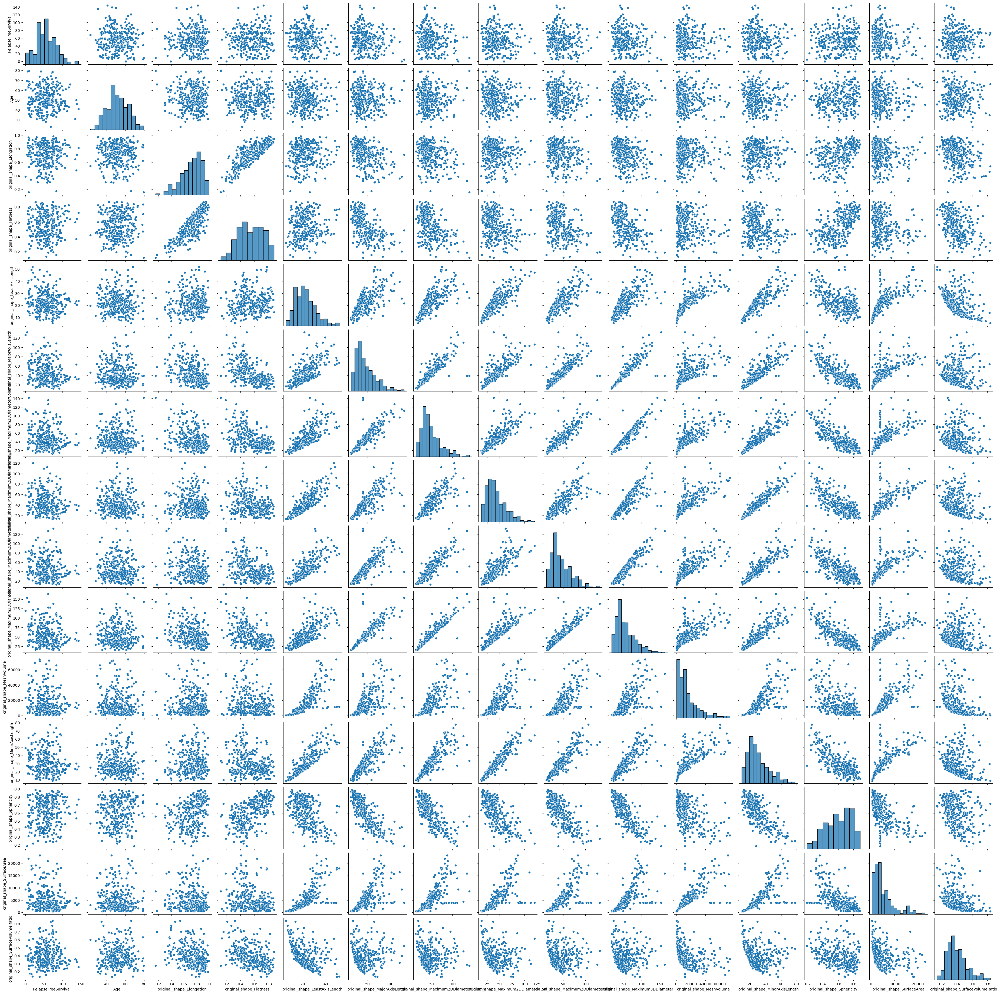

In [23]:
ourm = OutlierRemover(data_cont,list_cont)
data_cont_ourm = ourm.transform()
# Visualize pairplots
sns.pairplot(data_cont_ourm.iloc[:,0:15])

## Continous regressos with target `RelapseFreeSurvival`
- essentially no correlation
- linear algorithm may be unsuitable

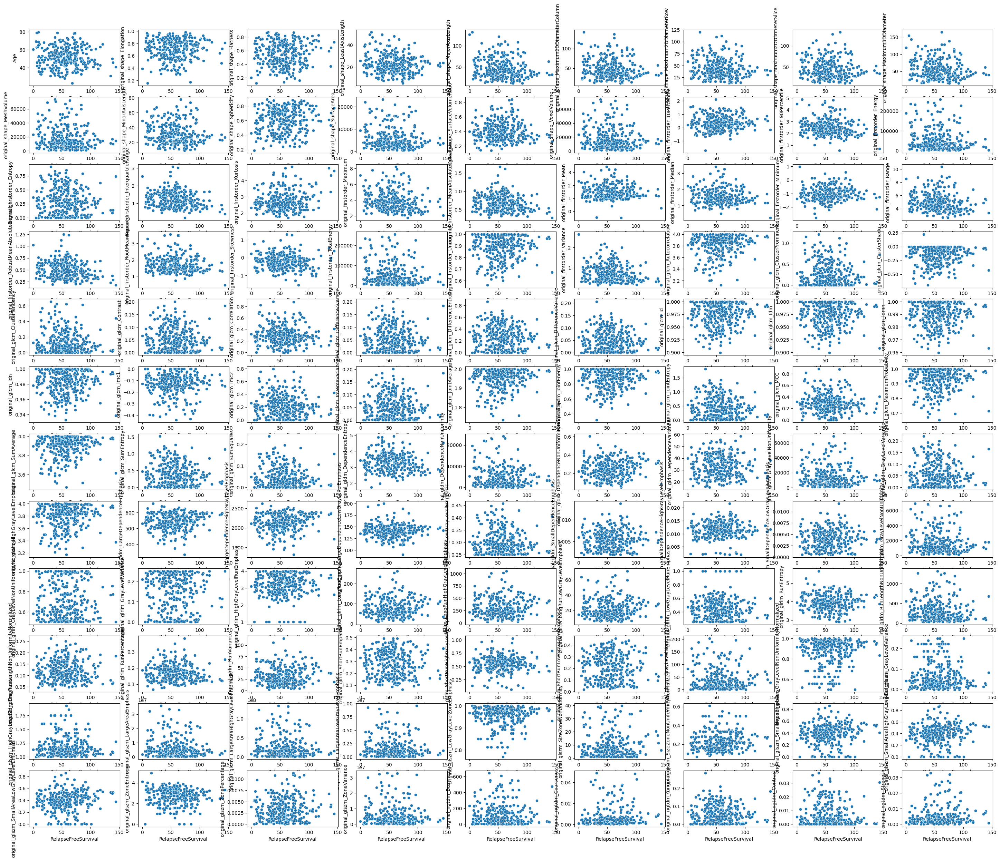

In [24]:
fig, axs = plt.subplots(12,9,figsize=(36,30))
ax = axs.ravel()

for i,j in enumerate(data_cont_ourm.columns.values[1:]):
    sns.scatterplot(x = data_cont_ourm['RelapseFreeSurvival'],y = data_cont_ourm.loc[:,j],ax=ax[i])

## 

## Explore Categorical features relative to to target
 - There is slight variation between mean `RelapseFreeSurvival` across different categorical inputs
 - ANOVA confirms that there is actually no mean difference of `RelapseFreeSurvival` across categorical inputs, potentially not good predictors for the target in linear models

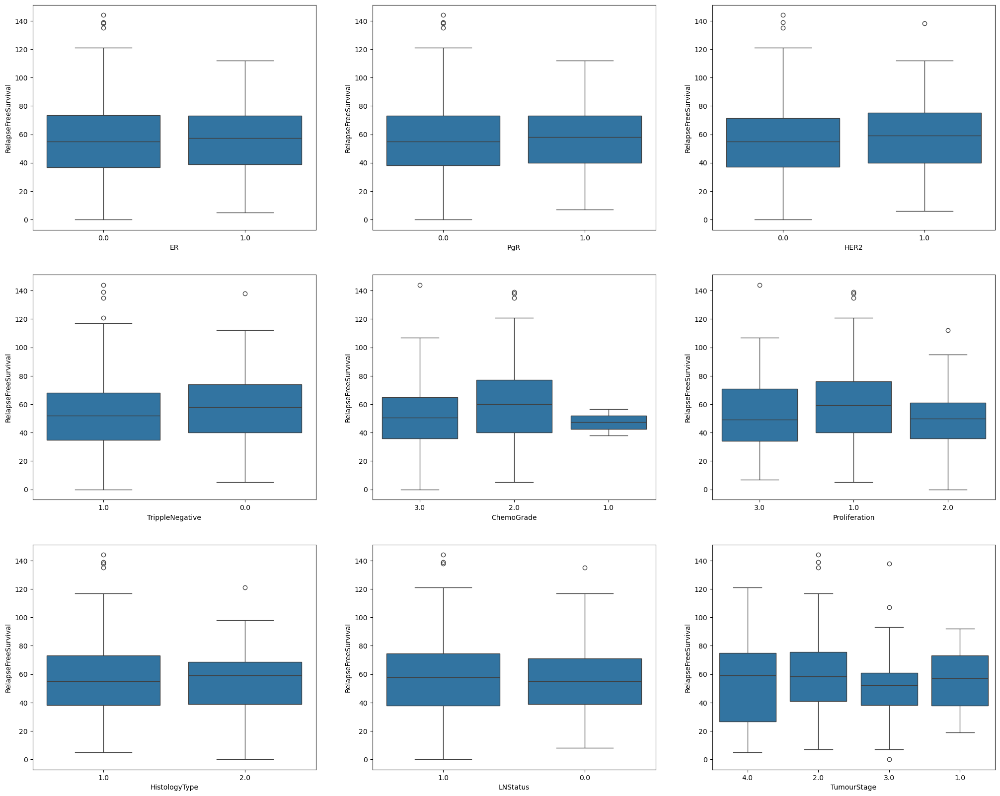

In [25]:
dfbox = pd.merge(data_cont_ourm.loc[:,['RelapseFreeSurvival']],data_cat.iloc[:,1:],left_index=True,right_index=True)
fig, axs = plt.subplots(3,3,figsize=(25,20))
ax = axs.ravel()

for i,c in enumerate(dfbox.iloc[:,1:].columns.values):
    sns.boxplot(x=c, y='RelapseFreeSurvival',ax=ax[i],data=dfbox)


# data_cont_ourm.loc[:,['RelapseFreeSurvival']]
# sns.boxplot(x = dfbox['RelapseFreeSurvival'],by=data_cat['ER'])
# fig, axs = plt.subplots(12,9,figsize=(36,30))
# 
# sns.boxplot(x=data_cont_ourm['RelapseFreeSurvival'])


#for i,j in enumerate(data_cat.columns.values[1:]):
    # sns.boxplot(x = data_cont_ourm['RelapseFreeSurvival'],y = data_cat.loc[:,j],ax=ax[i])

## ANOVA Test
- None of the p-values is statistically significant, thus no good predictor among categorical variabloes

In [26]:
## ANOVA test
from sklearn.feature_selection import f_classif, SelectKBest
X_anova = data_cat.iloc[:,1:]
y_anova=data_cont_ourm.loc[:,'RelapseFreeSurvival']

fstats, pvalues = f_classif(X_anova,y_anova)

fselector = SelectKBest(f_classif, k=2)
X_selected = fselector.fit_transform(X_anova,y_anova)

# print(f"selected features: {X_anova.columns.values[fselector.get_support()]}")
print(pvalues)



[0.18348459 0.41607043 0.75629011 0.6181516  0.24825108 0.75008864
 0.39248184 0.62719021 0.62447023]


## Random forest regressor
- Does not require feature selection, since by its design has inbuit feature selection methods
- Thus model is trained with all features included, redundant features will be dropped automatically


In [35]:
# Apply robust scaler to image data to scale them and remove outliers
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, RepeatedStratifiedKFold,RepeatedKFold, cross_val_score,cross_val_predict
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.compose import TransformedTargetRegressor

# Dataframe used is df_imputed, processing steps are embedded in a pipeline
target = 'RelapseFreeSurvival'
features_to_exlude_in_x = ['ID','pCR']

def split_x_y(dataframe,features_to_exlude_in_x,target):
    features_to_exlude_in_x.append(target)
    y = dataframe.loc[:,target]
    X = dataframe.loc[:,~dataframe.columns.isin(features_to_exlude_in_x)]
    return X, y

X,y = split_x_y(data_train,features_to_exlude_in_x,target)

# y = df_imp['RelapseFreeSurvival']
# X = df_imp.loc[:,~df_imp.columns.isin(['ID','pCR','RelapseFreeSurvival'])]

X_test, y_test = split_x_y(data_test,features_to_exlude_in_x,target)
Xcols = X_test.columns.values
# y_test = data_test['RelapseFreeSurvival']
# X_test = data_test.loc[:,~data_test.columns.isin(['ID','pCR','RelapseFreeSurvival'])]
# Xcols = [i for i in data_test.columns.values if i not in ['ID','pCR','RelapseFreeSurvival']]

## features to apply standard scaler
std_scaler_features = ['Age']
## features to apply robust scaler
rob_scaler_features = [i for i in X.columns.values if i not in std_scaler_features]


# create a pipeline to perform sequence of procesing and model training
imputer = Pipeline(steps=[('knn_imputer',KNNImputer(n_neighbors=1))])
rob_transformer = Pipeline(steps=[('knn_imputer',imputer),('rob_scaler',RobustScaler())])
std_transformer = Pipeline(steps=[('knn_imputer',imputer),('std_scaler',StandardScaler())])

preprocessor = ColumnTransformer(transformers=[('rob_scaler',rob_transformer,rob_scaler_features),
                                               ('std_scaler',std_transformer,std_scaler_features)])

# regressor = XGBRegressor()
regressor = RandomForestRegressor(random_state=0)
# transform target and use it in model
transformer = StandardScaler()
regressor = TransformedTargetRegressor(regressor=regressor,transformer=transformer)

model = Pipeline(steps=[('preprocessor',preprocessor),('regressor',regressor)])


param_grid = param_grid = [
 {'regressor__regressor__n_estimators': [50,100,200], 'regressor__regressor__max_features': [4, 6, 8,15],
 'regressor__regressor__bootstrap': [False,True]}]#, 'regressor__n_estimators': [3, 5,10], 'regressor__max_features': [2, 3, 4],
# }]

grid_search = GridSearchCV(estimator=model,param_grid=param_grid,cv=5,scoring='neg_mean_absolute_error')
grid_search.fit(X=X,y=y)
best_model = grid_search.best_estimator_
best_parameters = grid_search.best_params_

# cross_val_predict(best_model,X,y)
r2 = cross_val_score(best_model,X,y)
mae_cv = cross_val_score(best_model,X,y,scoring='neg_mean_absolute_error')



# Predict and test
r2_t = best_model.score(X_test,y_test)
y_pred = best_model.predict(X_test)
mae_test = mean_absolute_error(y_true=y_test,y_pred=y_pred)

print(f"MAE CV: {-np.mean(mae_cv):.3f}, cv_sd: {np.std(mae_cv):.3f}, MAE Test: {mae_test:.3f}")
# print(best_model)
# y_pred

MAE CV: 20.249, cv_sd: 2.080, MAE Test: 23.488


In [28]:
best_model.named_steps


{'preprocessor': ColumnTransformer(transformers=[('rob_scaler',
                                  Pipeline(steps=[('knn_imputer',
                                                   Pipeline(steps=[('knn_imputer',
                                                                    KNNImputer(n_neighbors=1))])),
                                                  ('rob_scaler',
                                                   RobustScaler())]),
                                  ['ER', 'PgR', 'HER2', 'TrippleNegative',
                                   'ChemoGrade', 'Proliferation',
                                   'HistologyType', 'LNStatus', 'TumourStage',
                                   'original_shape_Elongation',
                                   'original_shape_Flatness',
                                   'original_shape_Lea...
                                   'original_firstorder_90Percentile',
                                   'original_firstorder_Energy',
             

In [29]:
x = y_test-y_pred
(abs(x)>25).sum()/len(x)

0.4177215189873418

## Random forest regressor, without scaling
- Mean absolute error declines, better than scaled version

In [36]:
## Re-estimating the model with unscaled data
# 1. Remove outliers from data
# 2. Create new pipeline excluding scalers

out_remover = OutlierRemover(dataframe=data_train,cont_features_list=list_cont)
data_2 = out_remover.transform()

X,y = split_x_y(data_2,features_to_exlude_in_x,target)

# Pipeline
# create a pipeline to perform sequence of procesing and model training
imputer = Pipeline(steps=[('knn_imputer',KNNImputer(n_neighbors=1))])
preprocessor = ColumnTransformer(transformers=[('knn_imputer',imputer,Xcols)])

# regressor = XGBRegressor()
regressor = RandomForestRegressor(random_state=0)

model = Pipeline(steps=[('preprocessor',preprocessor),('regressor',regressor)])


param_grid = [
 {'regressor__n_estimators': [50,80,100,200], 'regressor__max_features': [2, 4, 6, 10,15],
 'regressor__bootstrap': [False,True]}]#, 'regressor__n_estimators': [3, 5,10], 'regressor__max_features': [2, 3, 4],
# }]

grid_search = GridSearchCV(estimator=model,param_grid=param_grid,cv=5,scoring='neg_mean_absolute_error')
grid_search.fit(X=X,y=y)
best_model = grid_search.best_estimator_
best_parameters = grid_search.best_params_


mae_cv = cross_val_score(best_model,X,y,scoring='neg_mean_absolute_error')


# Apply pipeline
mae_test = best_model.score(X_test,y_test)
y_pred = best_model.predict(X_test)
mae_test = mean_absolute_error(y_true=y_test,y_pred=y_pred)

print(f"CV Score: {-np.mean(mae_cv):.3f}, cv_sd: {np.std(mae_cv):.3f}, Test_score: {mae_test:.3f}")
print(best_model)





CV Score: 20.367, cv_sd: 2.248, Test_score: 23.016
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('knn_imputer',
                                                  Pipeline(steps=[('knn_imputer',
                                                                   KNNImputer(n_neighbors=1))]),
                                                  array(['Age', 'ER', 'PgR', 'HER2', 'TrippleNegative', 'ChemoGrade',
       'Proliferation', 'HistologyType', 'LNStatus', 'TumourStage',
       'original_shape_Elongation', 'original_shape_Flatness',
       'original_shape_LeastAxisLength', 'orig...
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_glszm_ZoneEntropy', 'original_glszm_ZonePercentage',
       'original_glszm_ZoneVariance', 'original_ngtdm_Busyness',
       'original_ngtdm_Coarseness', 'original_ngtdm_Complexity',
       'original_ngtdm_Contrast', 'original_ngtdm_Strength'], dtype=object))])),
                ('regressor',
       

In [31]:
pred = pd.DataFrame(y_pred,columns=['pred_RelapseFreeSurvival'],index=y_test.index)
pred_act = pd.merge(y_test,pred,left_index=True,right_index=True)
pred_act.head()


,RelapseFreeSurvival,pred_RelapseFreeSurvival
330,31.0,37.159167
319,67.0,63.866667
318,34.0,36.220000
66,92.0,80.815833
60,91.0,70.330833


## Support vector machine regreressor
- PCA is used for dimensianality reduction for image data
- Model based feature selection returns zero as all slopes are essentially zero given very lo correlation between features and target
- For categorical features, all features did not pass ANOVA test, all p-values were large

In [37]:
from sklearn.svm import SVR
from sklearn.feature_selection import SelectFromModel, SelectKBest,VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.linear_model import LassoCV

X,y = split_x_y(data_train,features_to_exlude_in_x,target)

X_test,y_test = split_x_y(data_test,features_to_exlude_in_x,target)

Xcols = X.columns.values

knn_imputer = KNNImputer(n_neighbors=1)
rob_transformer = Pipeline(steps=[('knn_imputer',knn_imputer),('rob_scaler',RobustScaler())])
std_transformer = Pipeline(steps=[('knn_imputer',knn_imputer),('std_scaler',StandardScaler())])

# var_select = Pipeline([('varselect',VarianceThreshold(threshold=2))])
shrink = Pipeline(steps=[('pca',PCA(n_components=2))])

preprocessor = ColumnTransformer(transformers=[('rob_scaler',rob_transformer,rob_scaler_features),
                                               ('std_scaler',std_transformer,std_scaler_features),
                                               ('pca',shrink,X.columns.values[10:])])
svm = SVR()
transformer = StandardScaler()
regressor = TransformedTargetRegressor(regressor=svm,transformer=transformer)

# preprocessor.fit_transform(X)
model = Pipeline(steps=[('preprocessor',preprocessor),('regr',regressor)])

param_grid = {
    'regr__regressor__C': [0.1, 1,5,10],
    'regr__regressor__epsilon': [0.1, 0.2, 0.3],
    'regr__regressor__kernel': ['poly', 'rbf']  # Different kernels
}

grid_search = GridSearchCV(estimator=model,param_grid=param_grid,cv=5,scoring='neg_mean_absolute_error')
grid_search.fit(X=X,y=y)
best_model = grid_search.best_estimator_
best_parameters = grid_search.best_params_
mae_cv = cross_val_score(best_model,X,y,scoring='neg_mean_absolute_error')


# Apply pipeline
mae_test = best_model.score(X_test,y_test)
y_pred = best_model.predict(X_test)
mae_test = mean_absolute_error(y_true=y_test,y_pred=y_pred)

print(f"CV Score: {-np.mean(mae_cv):.3f}, cv_sd: {np.std(mae_cv):.3f}, Test_score: {mae_test:.3f}")
print(best_model)



CV Score: 20.932, cv_sd: 1.814, Test_score: 22.469
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('rob_scaler',
                                                  Pipeline(steps=[('knn_imputer',
                                                                   KNNImputer(n_neighbors=1)),
                                                                  ('rob_scaler',
                                                                   RobustScaler())]),
                                                  ['ER', 'PgR', 'HER2',
                                                   'TrippleNegative',
                                                   'ChemoGrade',
                                                   'Proliferation',
                                                   'HistologyType', 'LNStatus',
                                                   'TumourStage',
                                                   'original_shape_Elongation',
       

In [33]:
# lets see what is inside the pipeline
# mask = best_model.named_steps['varselect'].named_steps['varselect'].get_support()
# Xcols[mask]
# len(Xcols[mask])
pca_transformer = best_model.named_steps['preprocessor'].named_transformers_['pca'].named_steps['pca']
zz = pca_transformer.components_

np.cumsum(pca_transformer.explained_variance_ratio_)


# zz = pca_transformer.transform(X.iloc[:,10:])


array([0.86703668, 0.99981776])

In [51]:
# Apply robust scaler to image data to scale them and remove outliers
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, RepeatedStratifiedKFold,RepeatedKFold, cross_val_score,cross_val_predict
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.compose import TransformedTargetRegressor

# Dataframe used is df_imputed, processing steps are embedded in a pipeline
target = 'RelapseFreeSurvival'
features_to_exlude_in_x = ['ID','pCR']


X,y = split_x_y(data_train,features_to_exlude_in_x,target)

# y = df_imp['RelapseFreeSurvival']
# X = df_imp.loc[:,~df_imp.columns.isin(['ID','pCR','RelapseFreeSurvival'])]

X_test, y_test = split_x_y(data_test,features_to_exlude_in_x,target)
Xcols = X_test.columns.values
# y_test = data_test['RelapseFreeSurvival']
# X_test = data_test.loc[:,~data_test.columns.isin(['ID','pCR','RelapseFreeSurvival'])]
# Xcols = [i for i in data_test.columns.values if i not in ['ID','pCR','RelapseFreeSurvival']]

## features to apply standard scaler
std_scaler_features = ['Age']
## features to apply robust scaler
rob_scaler_features = [i for i in X.columns.values if i not in std_scaler_features]


# create a pipeline to perform sequence of procesing and model training
imputer = Pipeline(steps=[('knn_imputer',KNNImputer(n_neighbors=1))])
# rob_transformer = Pipeline(steps=[('knn_imputer',imputer),('rob_scaler',RobustScaler())])
# std_transformer = Pipeline(steps=[('knn_imputer',imputer),('std_scaler',StandardScaler())])

# preprocessor = ColumnTransformer(transformers=[('rob_scaler',rob_transformer,rob_scaler_features),
                                            #    ('std_scaler',std_transformer,std_scaler_features)])

regressor = XGBRegressor()
# regressor = RandomForestRegressor(random_state=0)
# transform target and use it in model
# transformer = StandardScaler()
# regressor = TransformedTargetRegressor(regressor=regressor,transformer=transformer)

model = Pipeline(steps=[('imputer',imputer),('regressor',regressor)])


param_grid = param_grid = [
 {'regressor__n_estimators': [50,100,200], 'regressor__max_depth': [3,4,5],
 'regressor__learning_rate': [0.01,0.05,0.15],'regressor__colsample_bytree':[0.05,0.1,0.2],
 'regressor__gamma':[0,0.1,0.2]}]#, 'regressor__n_estimators': [3, 5,10], 'regressor__max_features': [2, 3, 4],
# }]

grid_search = GridSearchCV(estimator=model,param_grid=param_grid,cv=5,scoring='neg_mean_absolute_error',n_jobs=-1)
grid_search.fit(X=X,y=y)
best_model = grid_search.best_estimator_
best_parameters = grid_search.best_params_

# cross_val_predict(best_model,X,y)
# model = model.fit(X=X,y=y)

mae_cv = cross_val_score(best_model,X,y,scoring='neg_mean_absolute_error')



# Predict and test
r2_t = best_model.score(X_test,y_test)
y_pred = best_model.predict(X_test)
mae_test = mean_absolute_error(y_true=y_test,y_pred=y_pred)

print(f"MAE CV: {-np.mean(mae_cv):.3f}, cv_sd: {np.std(mae_cv):.3f}, MAE Test: {mae_test:.3f}")
print(best_model)
# y_pred

MAE CV: 20.042, cv_sd: 2.116, MAE Test: 24.316
Pipeline(steps=[('imputer',
                 Pipeline(steps=[('knn_imputer', KNNImputer(n_neighbors=1))])),
                ('regressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=0.1, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=0.1, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=0.05,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=4, max_leaves=None,
                              min_child_weight=None, missing=nan,
              